### <center>Student: *Valery Stoeva*</center>

## Description

1. Choose the time period to form the graph
2. Those how are making projects on artilces: half of you need to choose co-authorship graph, others - citation (but consider citation graph as undirected for simplicity)
3. Use weighted graph so that probabilities of infection passing is proportional to the edge weight 

### Data

You need to use data from your project

### Model

Consider SIR-based epidemic model using idea of percolation

Link to source: http://www.leonidzhukov.net/hse/2015/networks/papers/networks-book-ch21.pdf 

### Task

You are in charge of leading the vaccination campaign against some outbroken nonlethal disease. You have options to vactinate or provide medical treatment to infected ones. However, everything has its costs:
* Vaccination of a node costs $500 \$$ and make it immune to the disease all life-long. Unfortunately, you can help this way only to no more than $10\%$ of your nodes
* Medical Treatment costs $120\$$ per day of illness period, which in turn may take from $3$ to $7$ days

Your task is to implement the simulation model, propose some vaccination strategies and compare them (one iteration = one day).

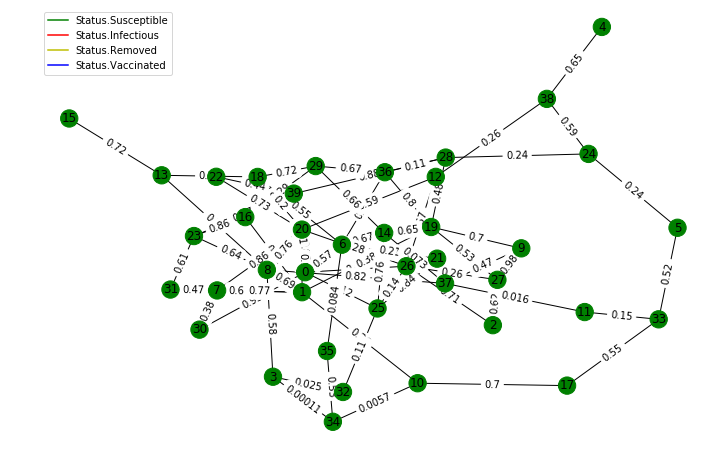

In [400]:
import networkx as nx
from enum import Enum
import random
import itertools
import matplotlib.pyplot as plt
from time import sleep
from copy import deepcopy
import pandas as pd
from collections import Counter

# in SIR model we have 3 statuses, plus extra one
class Status(Enum):
    Susceptible = 1
    Infectious = 2
    Removed = 3
    Vaccinated = 4

colors_mapping = {
    Status.Susceptible: 'g',
    Status.Infectious: 'r',
    Status.Removed: 'y',
    Status.Vaccinated: 'b',
}
    
    
def draw_graph(G, pos, epoch=None, weights=False, labels=False):
    options = {
        'line_color': 'grey',
        'node_color': [colors_mapping[status] for node, status in G.nodes(data='status')],
    }
    if labels:
        options['with_labels'] = True

    plt.figure(3,figsize=(12,8)) 
    for status, color in colors_mapping.items():
        plt.plot([0],[0],color=color,label=status)
    nx.draw(G,pos=pos, **options)
    if weights:
        nx.draw_networkx_edge_labels(
            G,
            pos=pos,
            edge_labels={(i, j): '{:.2}'.format(p) for i, j, p in graph.edges(data='p')}
        )
    if epoch is not None:
        plt.title('Epoch {}'.format(epoch))
        
    plt.axis('off')
    plt.legend()
    plt.show()
    

N_nodes = 40
p_edge = 1/10

# we need an expectation of days of an illness period to be 5, so we need a geometric distribution with q=0.2
# as desctibed in the paper
q_removed = 0.2 

# fraction of a population to be initially infected
to_infect = 0.1

def get_random_graph():
    G = nx.Graph()
    for i in range(N_nodes):
        G.add_node(i, status=Status.Susceptible)

    for i,j in itertools.combinations(range(N_nodes), 2):
        if random.random() < p_edge:
            G.add_edge(i, j, p=random.random())
    return G

def random_init(G):
    # make initialization "random"(fair), but stable from run to run
    for node in sorted(G.nodes(), key=hash)[:int(len(G.nodes()) * to_infect)]:
        G.nodes[node]['status'] = Status.Infectious

graph = get_random_graph()
layout = nx.spring_layout(graph, scale=2)
draw_graph(graph, layout, weights=True, labels=True)

In [401]:
def random_vacination(G):
    clean = [node for node, status in G.nodes(data='status') if status == Status.Susceptible]
    money_v = 0
    for node in random.sample(clean, len(G.nodes()) // 10):
        G.nodes[node]['status'] = Status.Vaccinated
        money_v += 500
    return money_v

In [402]:
def step(G):
    # подсчет средств на содержание
    money_s = 120 * sum(status == Status.Infectious for node, status in G.nodes(data='status'))
    # кандидаты для выздоровления
    to_remove = [
        node
        for node, status in G.nodes(data='status')
        if status == Status.Infectious and random.random() < q_removed
    ]
    
    # заражение незараженных
    clean = [node for node, status in G.nodes(data='status') if status == Status.Susceptible]
    for node in clean:
        for neighbour, attrs in G[node].items():
            if G.nodes[neighbour]['status'] == Status.Infectious:
                if random.random() < attrs['p']:
                    G.nodes[node]['status'] = Status.Infectious
                    break
    # выздоровление зараженных
    for node in to_remove:
        G.nodes[node]['status'] = Status.Removed
    return money_s
    
def check_infected(G):
    return any(status == Status.Infectious for node, status in G.nodes(data='status'))

In [403]:
def cycle(G_in, vacination, layout, draw=True):
    G = deepcopy(G_in)
    epoch = 0
    random_init(G)
    money = vacination(G)
    if draw:
        draw_graph(G, layout, epoch)
    while check_infected(G):
        epoch += 1
        money += step(G)
        if draw:
            draw_graph(G, layout, epoch)
    print('Total: {}$'.format(money))

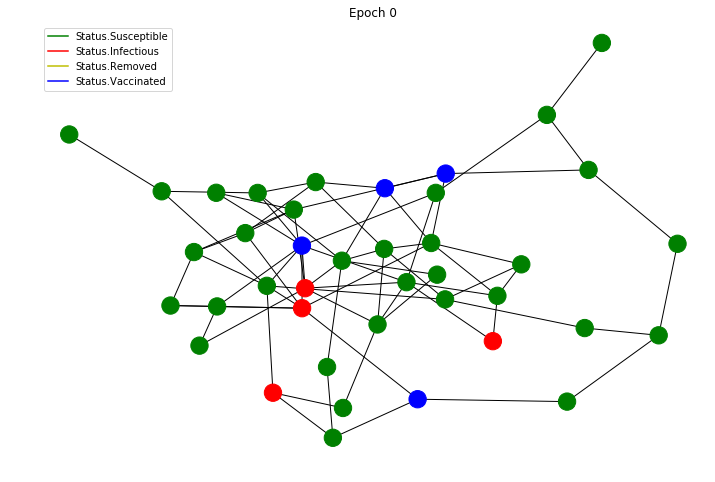

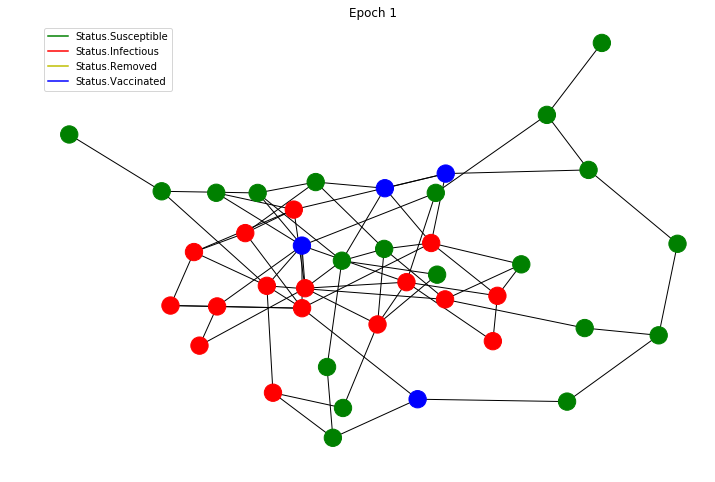

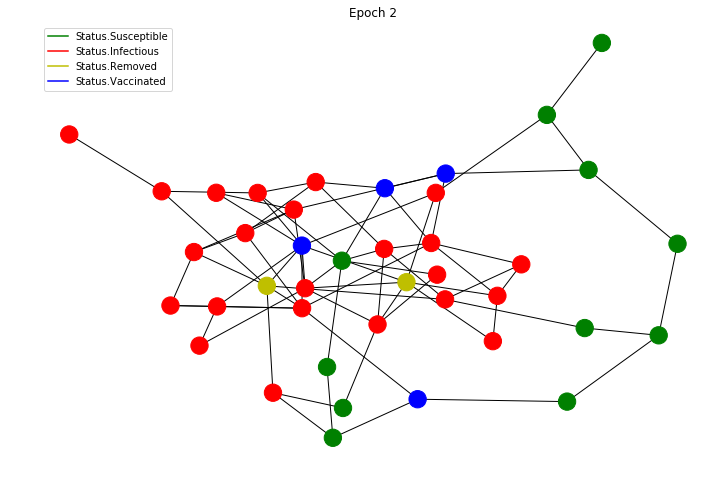

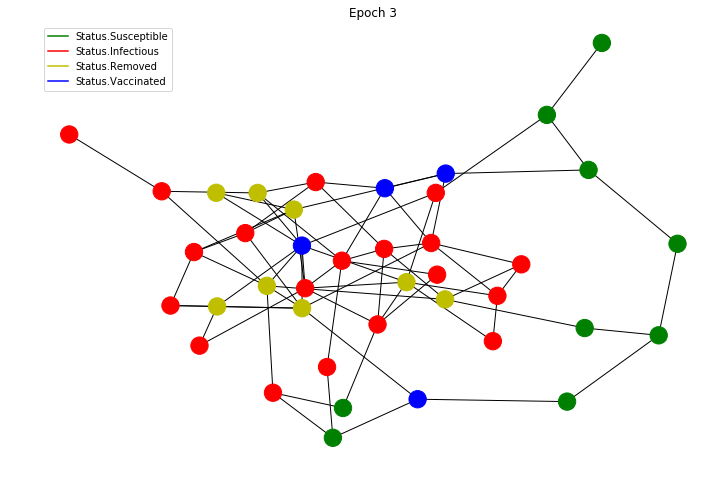

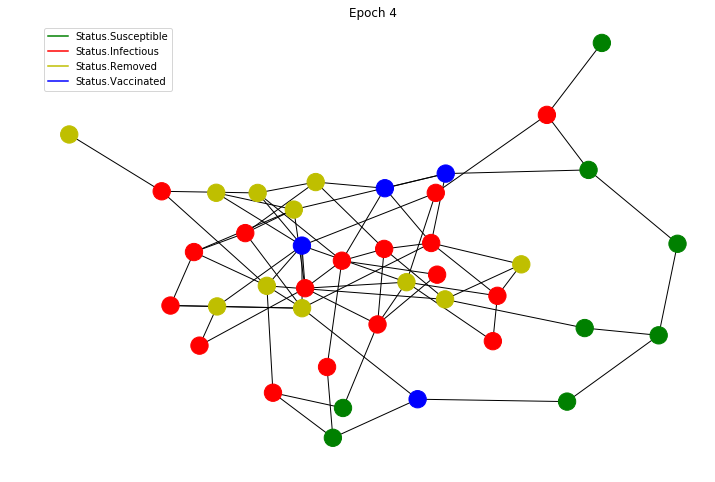

...

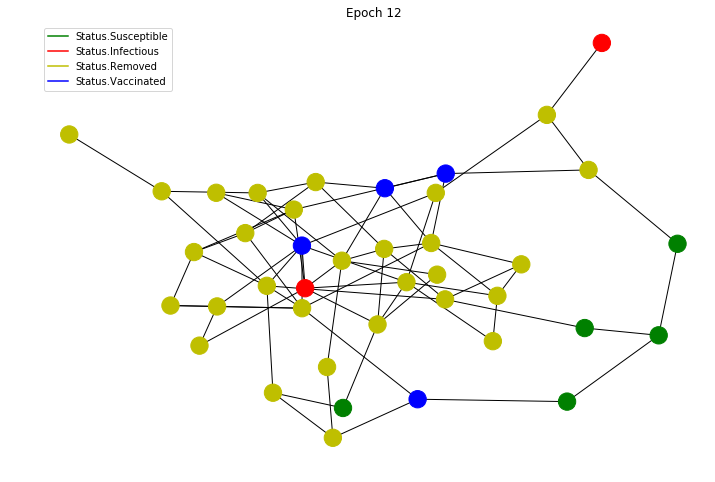

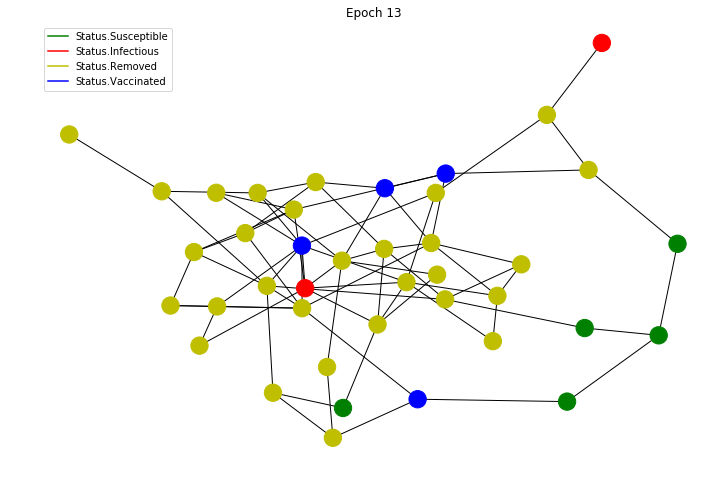

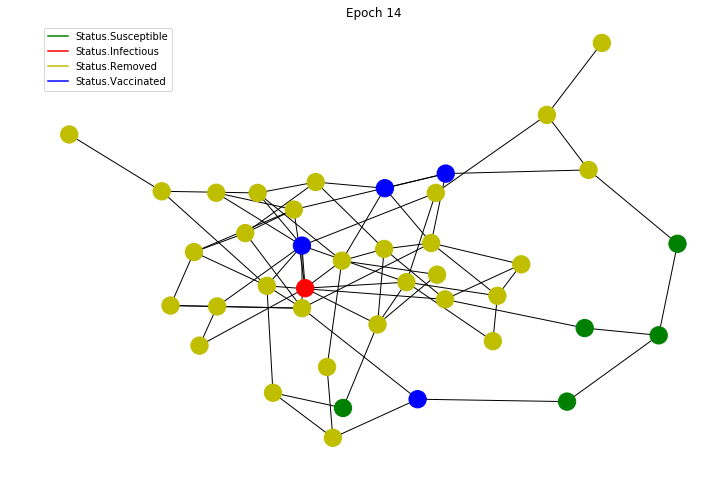

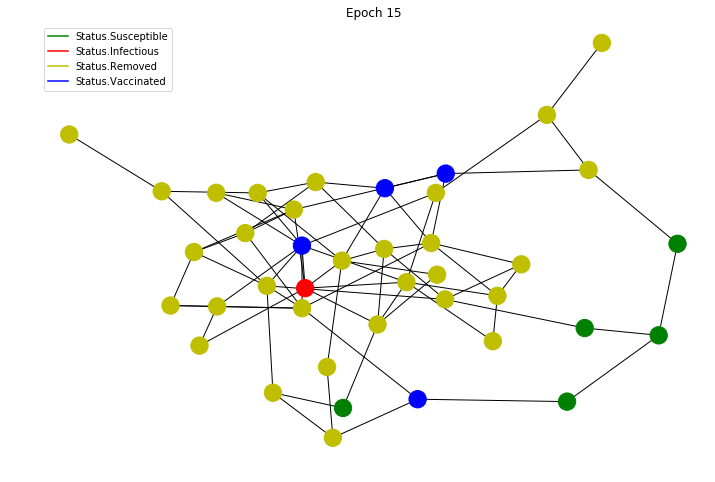

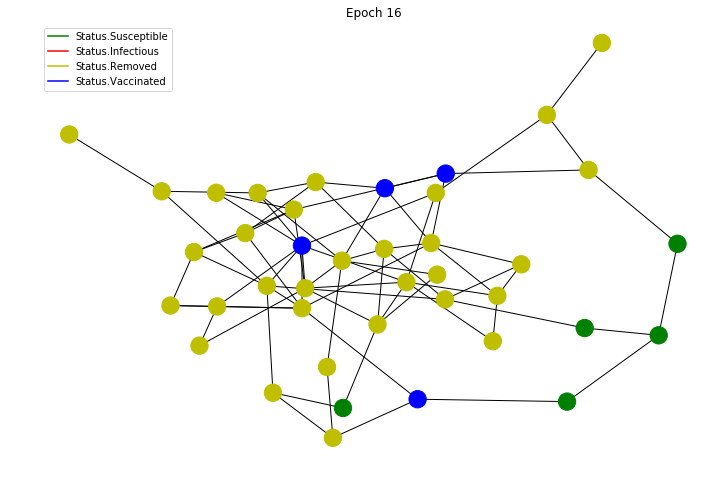

Total: 18680$


In [404]:
cycle(graph, random_vacination, layout)

## Вакцинация центра графа

Центр графа - множество всех вершин A, для которой максимальное расстояние d(A,B) до других вершин B минимально. Расстояния до других вершин посчитаем алгоритмом Флойда-Уоршелла.

In [405]:
def vacinate_center(G):
    max_dists = {}
    for node, others in nx.floyd_warshall(G).items():
        if G.nodes[node]['status'] != Status.Infectious:
            max_dists[node] = max(others.values())
    to_vac = sorted(max_dists.keys(), key=lambda node: max_dists[node])[:len(G.nodes) // 10]
    money_v = 0
    for node in to_vac:
        G.nodes[node]['status'] = Status.Vaccinated
        money_v += 500
    return money_v

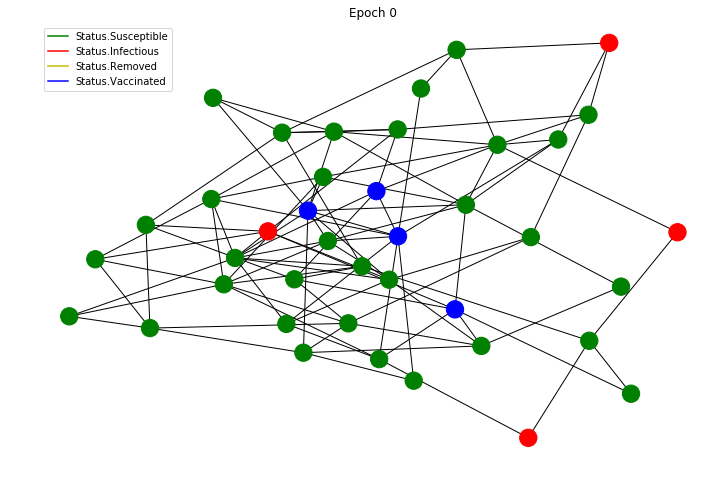

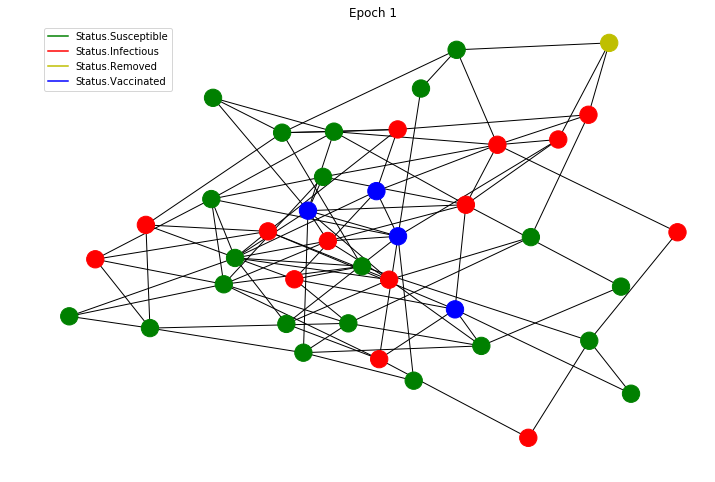

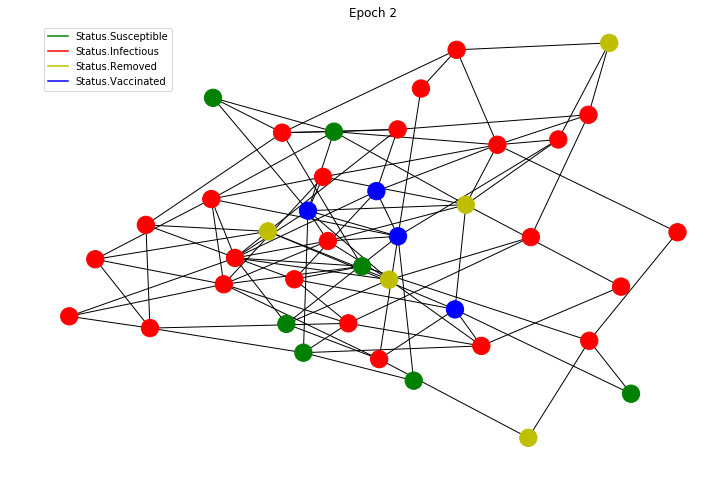

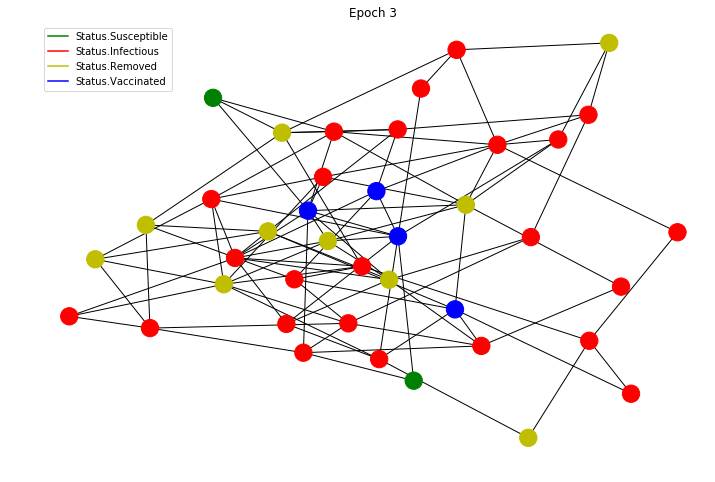

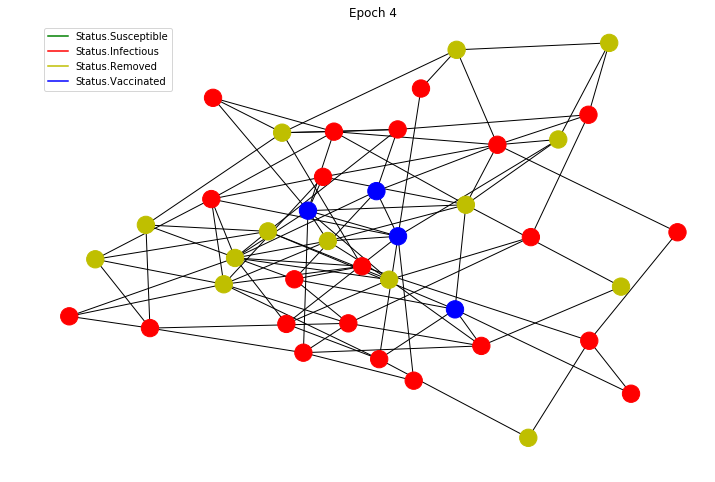

...

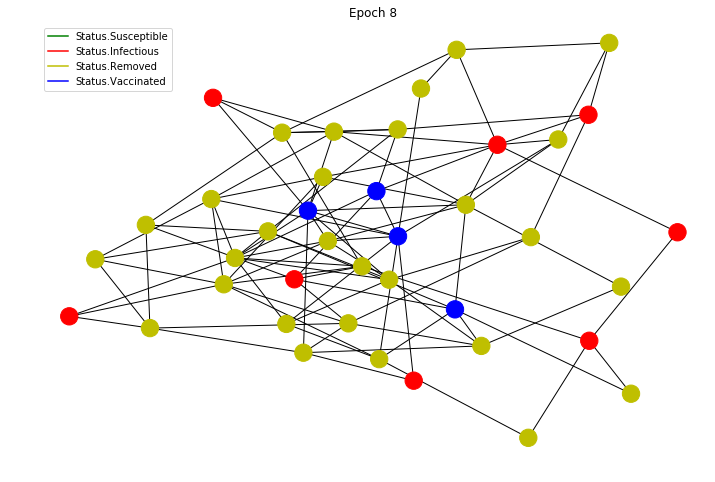

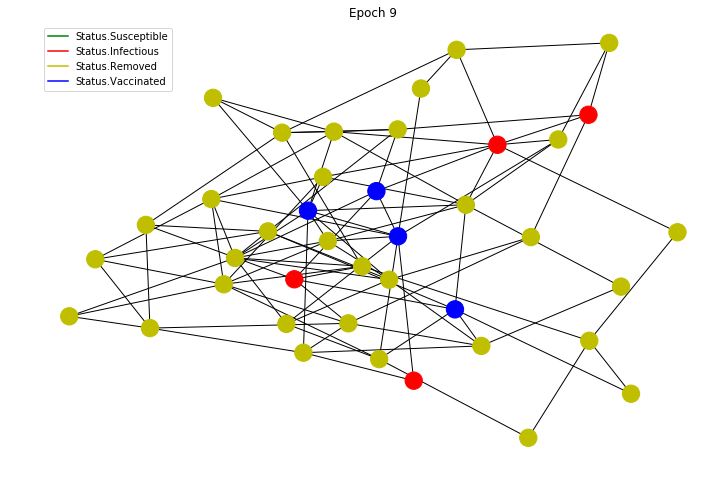

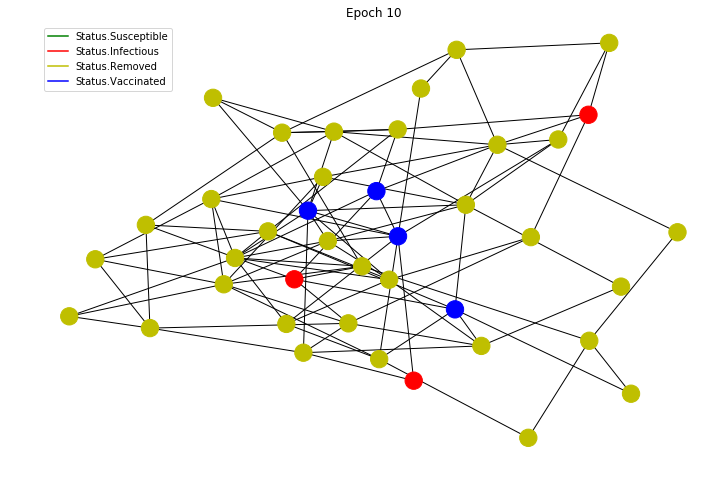

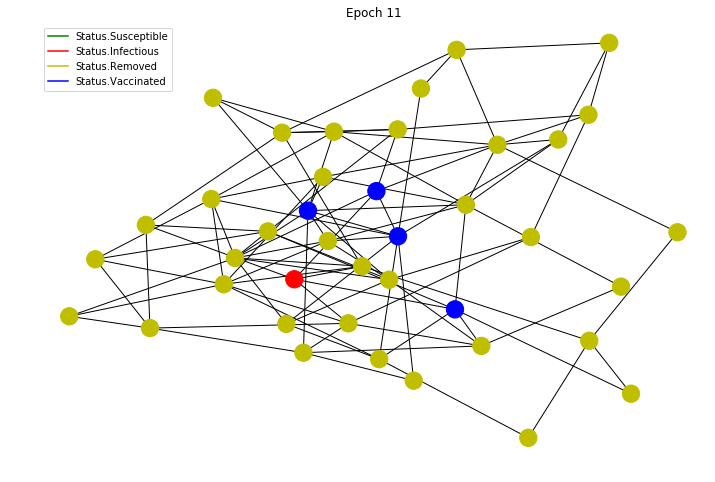

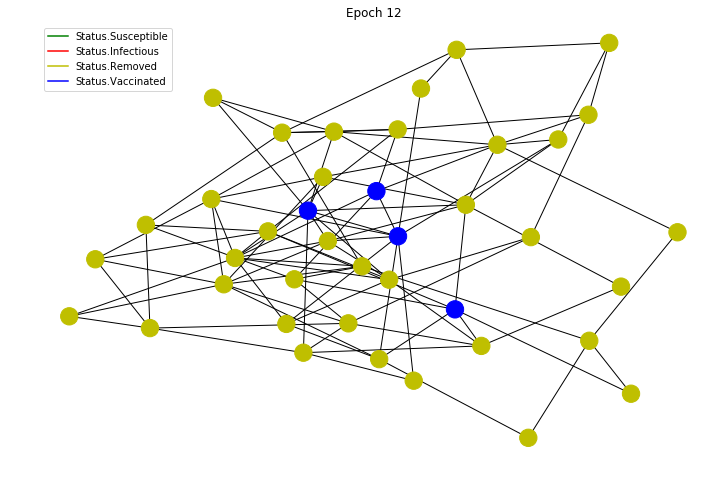

Total: 19280$


In [406]:
graph = get_random_graph()
layout = nx.spring_layout(graph, scale=2)
cycle(graph, vacinate_center, layout)

В случае случайного графа выигрыша нет.

## Граф соавторств
Загрузим данные

In [302]:
data=pd.read_excel('articles.xls',sep=';')['Author']

res={}
for i in data:
    if str(i) not in ('nan', 'None'):
        aus = i.split(';')
        auids = [l.split(':')[1] for l in aus]
        for j in auids:
            c = Counter([k for k in auids if k!=j])
            if j in res:
                res[j]+=c
            else:
                res[j]=c
edges = []
for k, v in res.items():
    for j, w in v.items():
        edges.append((k, j, w))
        
coauth_graph = nx.Graph()
coauth_graph.add_weighted_edges_from(edges)

Граф не будет связным, посмотрим на его компоненты связности

In [303]:
biggest = sorted(nx.connected_component_subgraphs(coauth_graph), key=len, reverse=True)[:5]
list(map(len, biggest))

[21258, 180, 119, 110, 90]

Первая компонента слишком огромная, для визуализации нам удобно взять небольшую компоненту, возьмем вторую

In [369]:
coauth_comp = biggest[1]
comp_layout = nx.spring_layout(coauth_comp, scale=1)
for node in coauth_comp.nodes:
    coauth_comp.nodes[node]['status'] = Status.Susceptible

/usr/local/lib/python3.6/dist-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


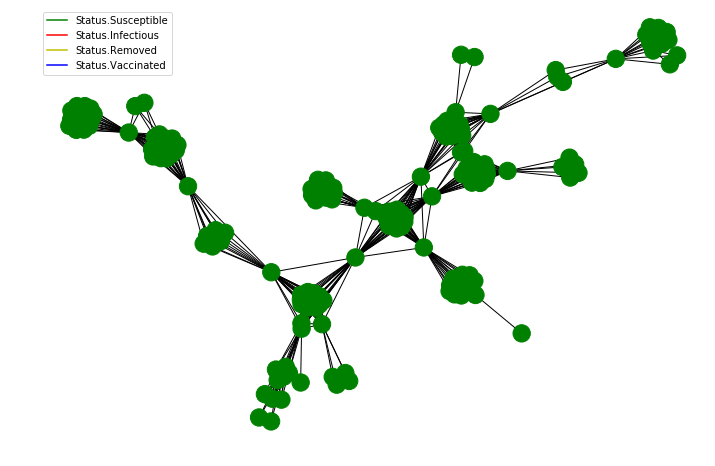

In [370]:
draw_graph(coauth_comp, comp_layout)

Отнормируем вероятности:

In [371]:
max_weight = max(map(lambda edge: coauth_comp.edges[edge]['weight'], coauth_comp.edges))
for edge in coauth_comp.edges:
    coauth_comp.edges[edge]['p'] = 0.97 * coauth_comp.edges[edge]['weight'] / max_weight

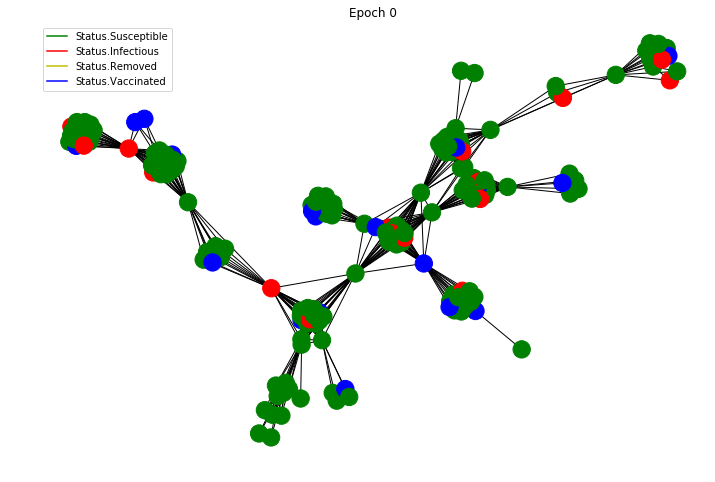

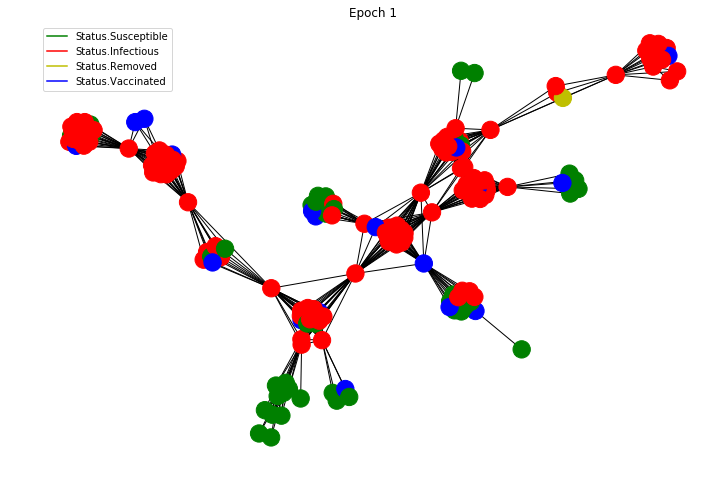

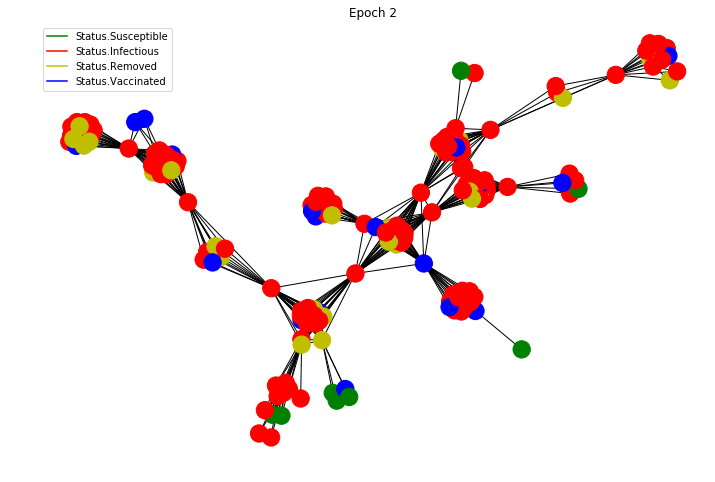

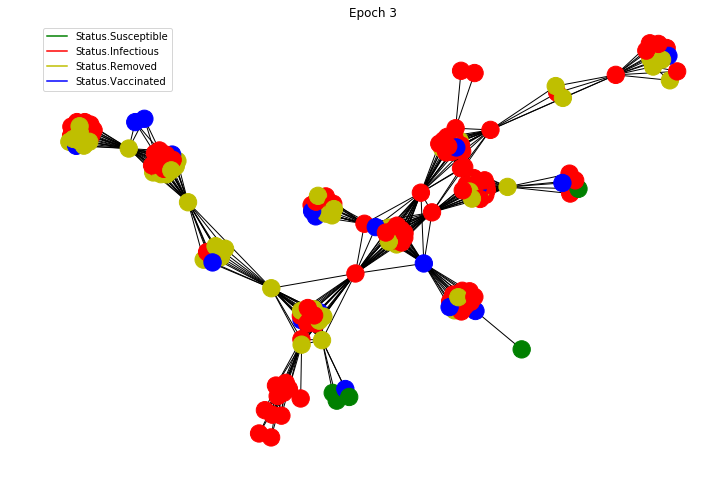

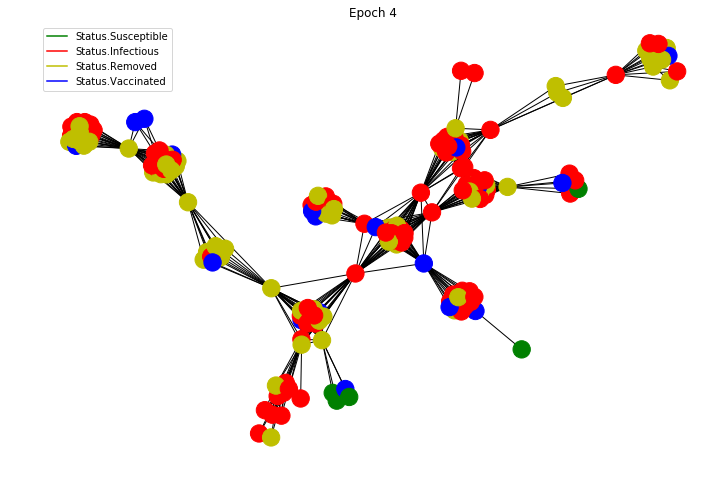

...

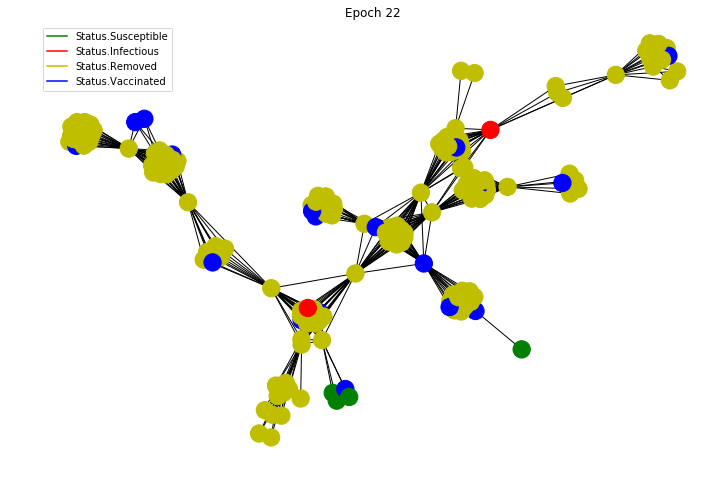

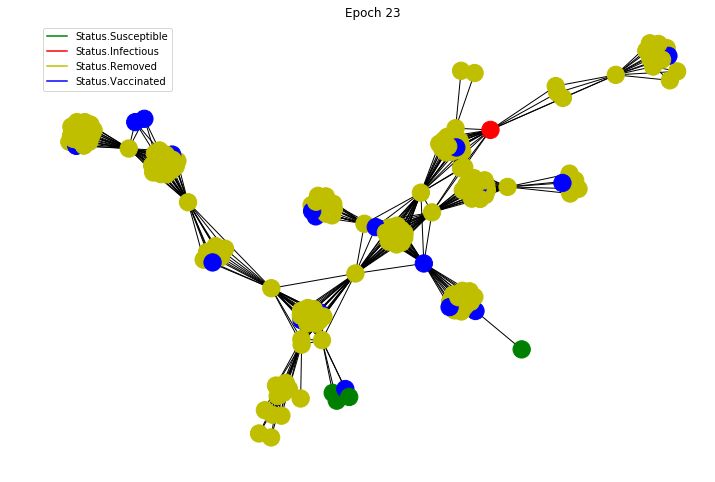

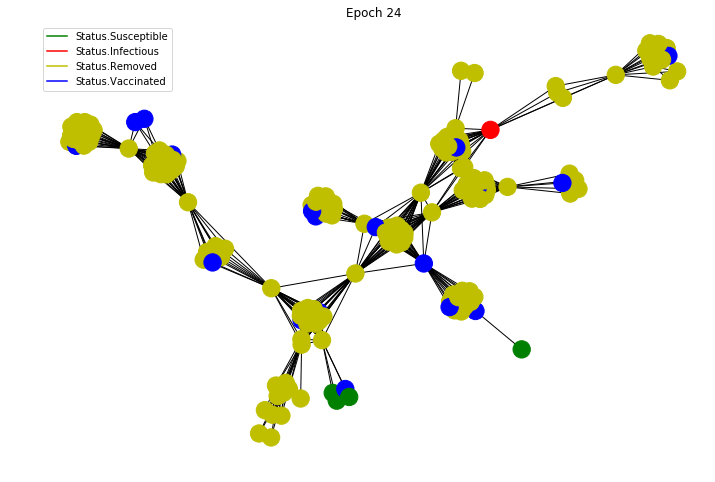

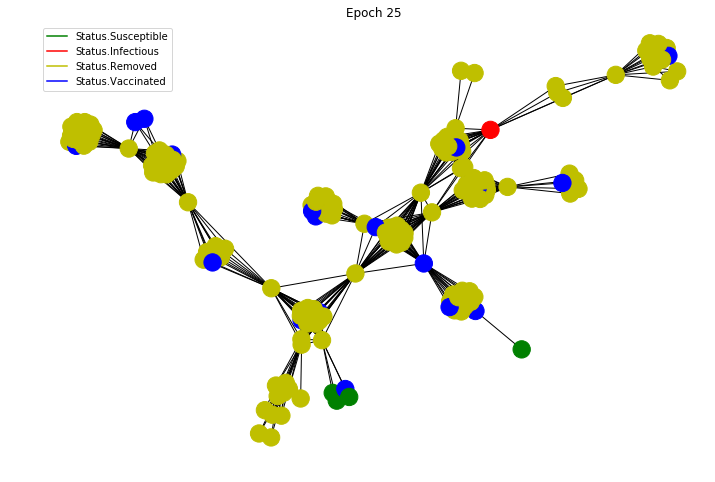

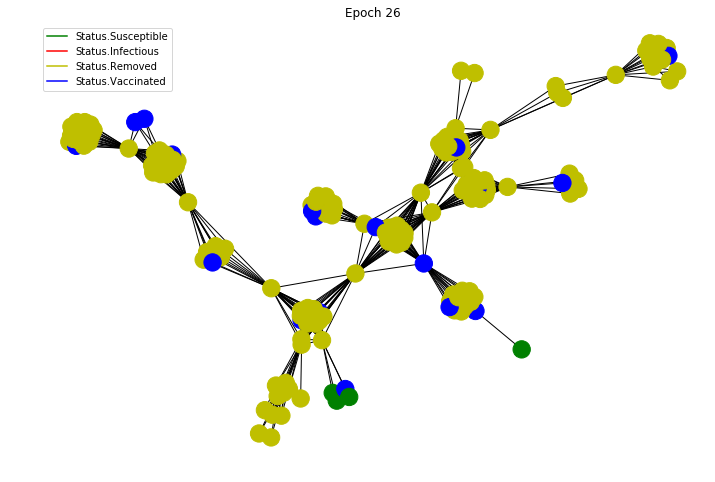

Total: 107160$


In [372]:
cycle(coauth_comp, random_vacination, comp_layout)

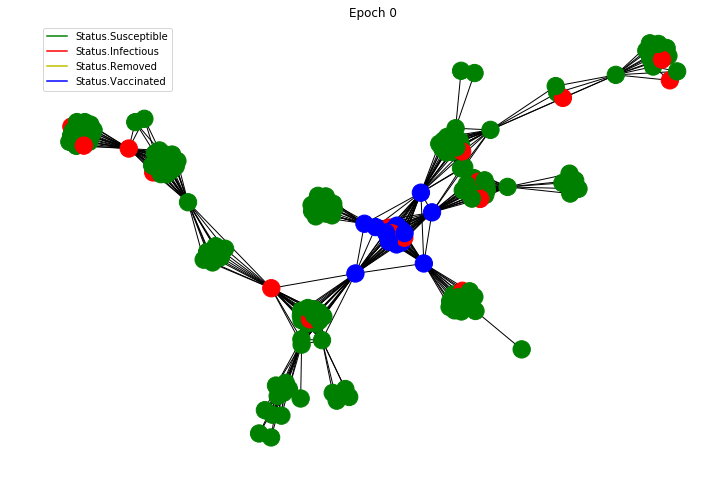

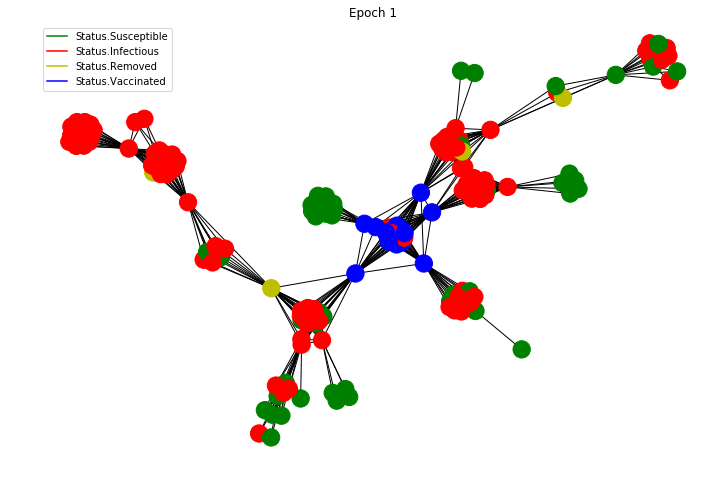

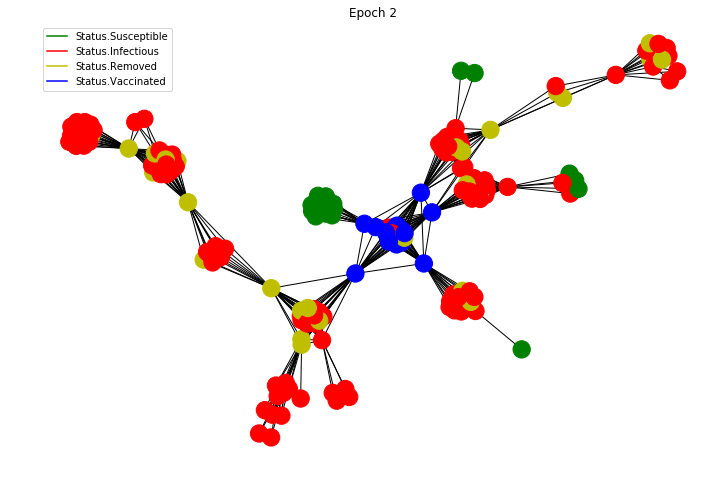

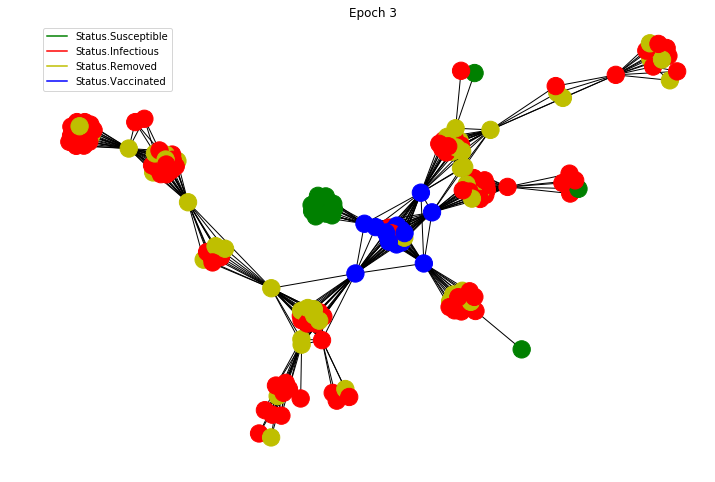

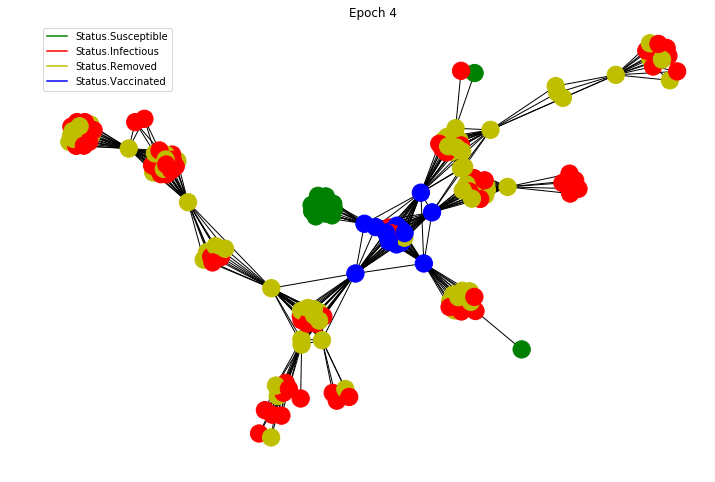

...

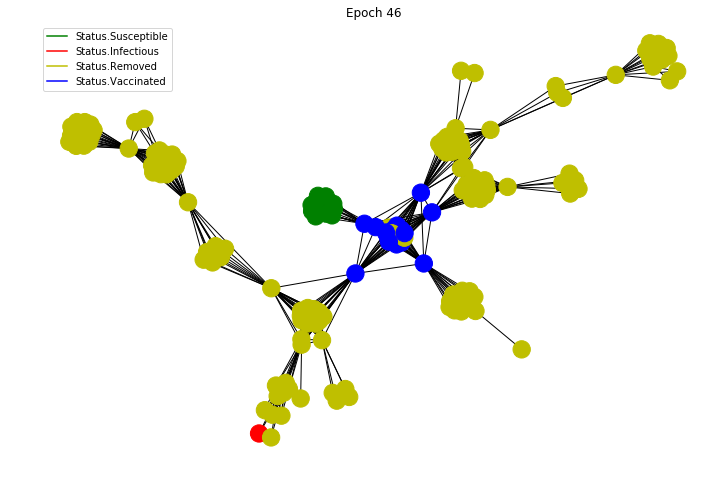

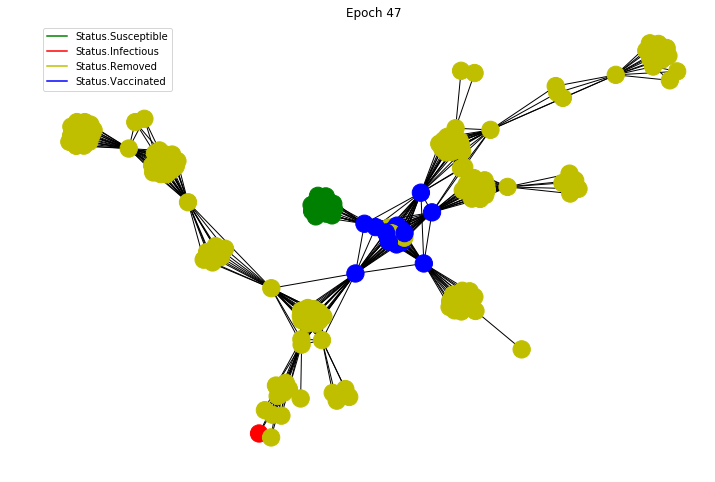

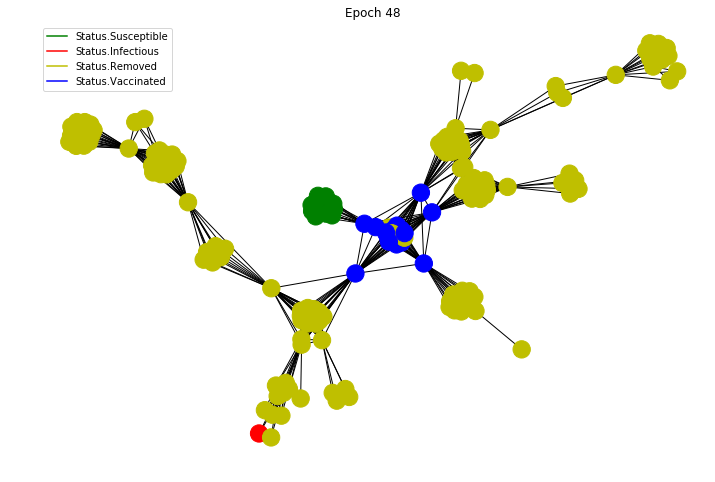

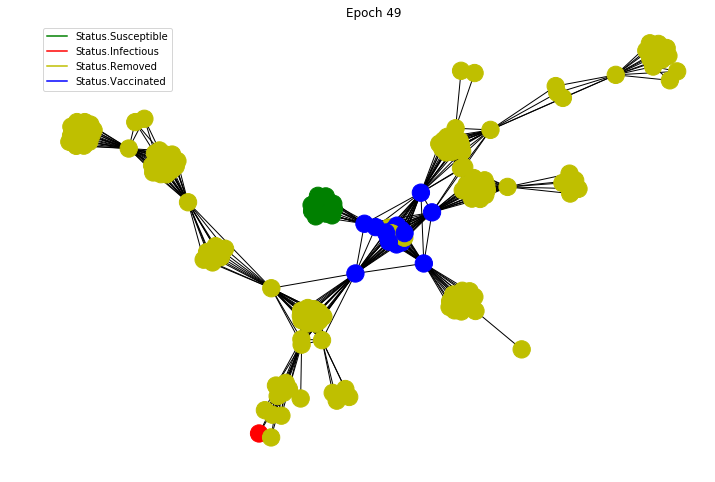

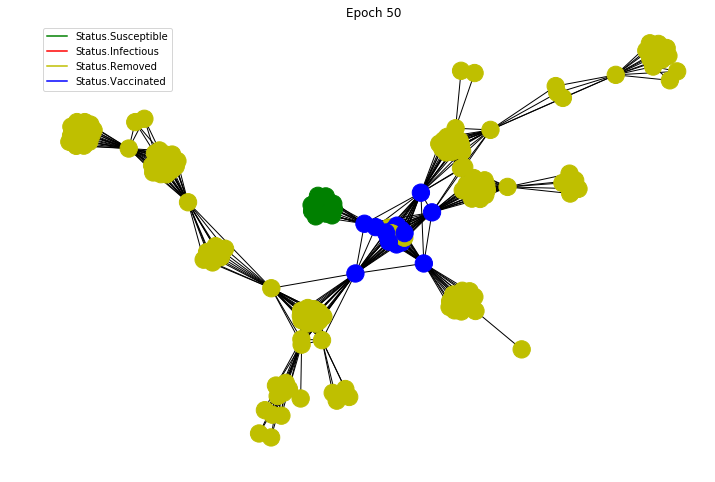

Total: 104160$


In [373]:
cycle(coauth_comp, vacinate_center, comp_layout)

Ощутимого прироста нет, попробуем другие стратегии, например, изолировать самых активных членов общества, сначала для меры активности будем просто брать степень вершины.

## Изоляция вершин с самой большой степенью

In [380]:
def isolate_max_degree(G):
    degrees = {}
    for node in G.nodes:
        if G.nodes[node]['status'] == Status.Susceptible:
            degrees[node] = len(G[node])
    v_money = 0
    for node in sorted(degrees.keys(), key=lambda node: degrees[node], reverse=True)[:len(G.nodes)//10]:
        G.nodes[node]['status'] = Status.Vaccinated
        v_money += 500
    return v_money

/usr/local/lib/python3.6/dist-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


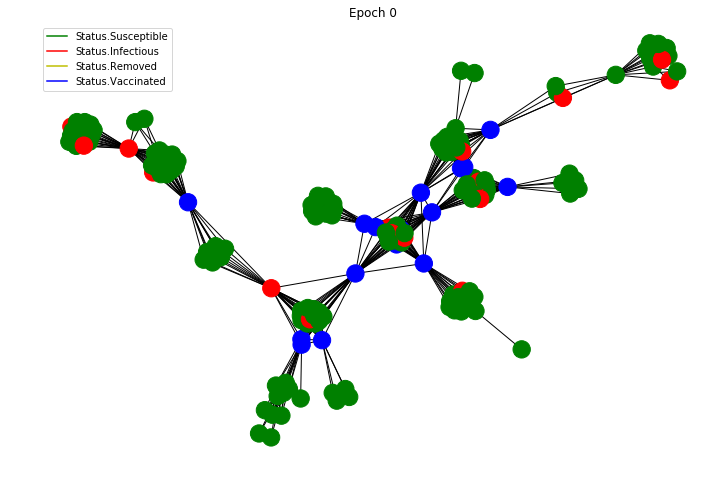

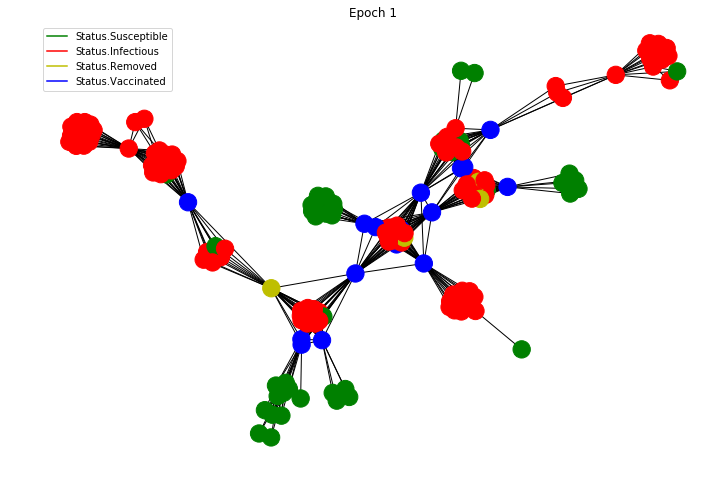

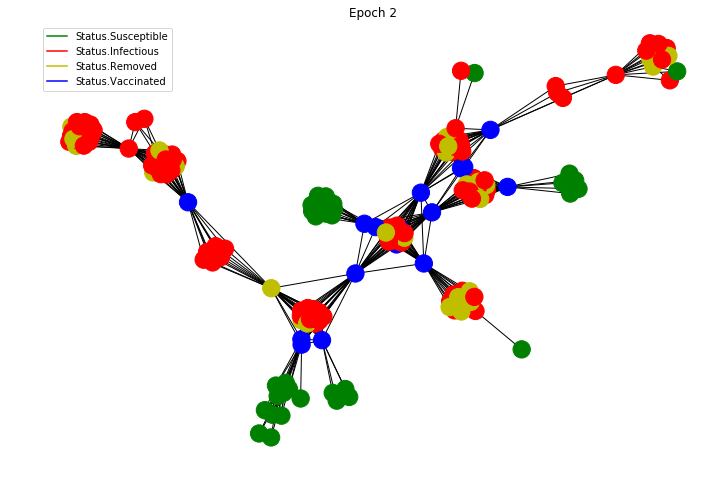

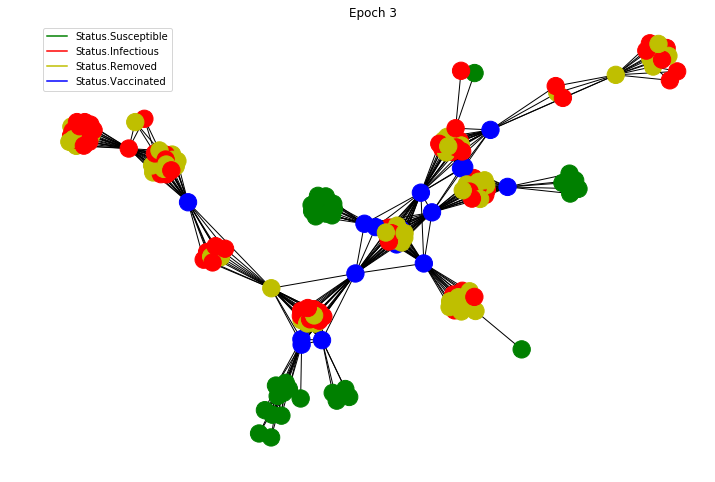

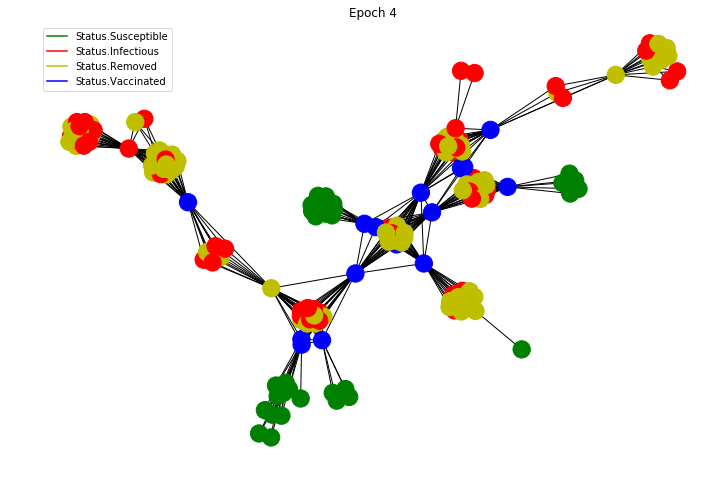

...

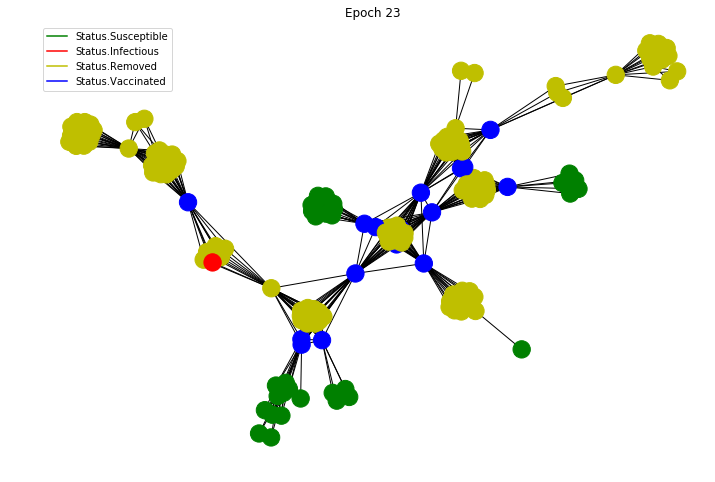

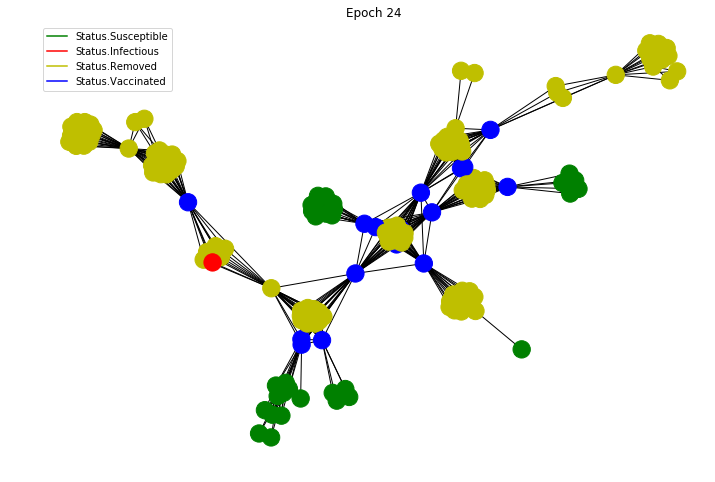

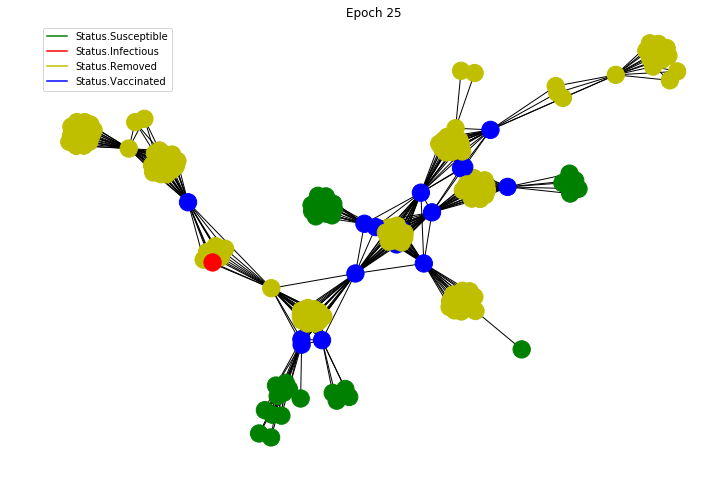

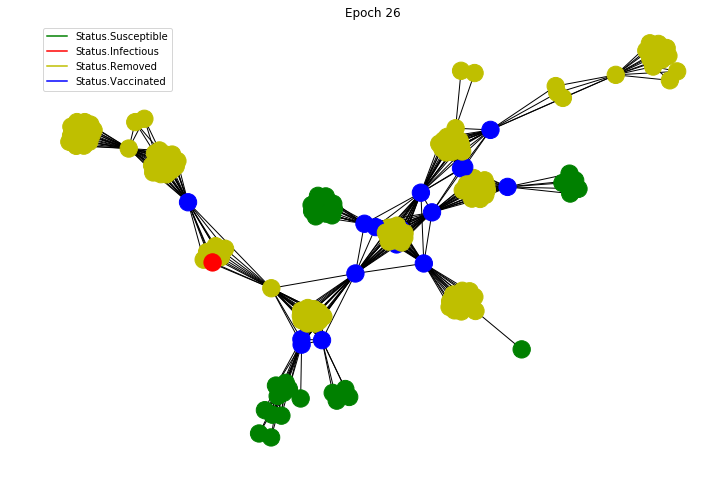

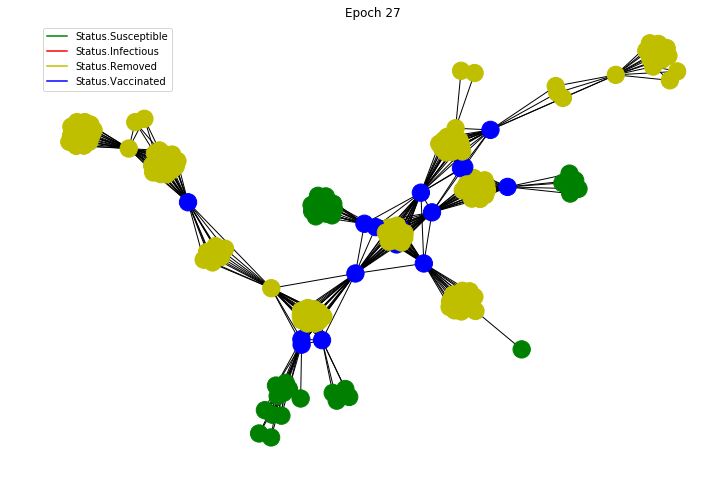

Total: 86040$


In [381]:
cycle(coauth_comp, isolate_max_degree, comp_layout)

Попробуем теперь в качестве меры активности брать не степень, а "взешенную" степень, учитывая вероятности распространения.

In [384]:
def isolate_max_weighted_degree(G):
    degrees = {}
    for node in G.nodes:
        if G.nodes[node]['status'] == Status.Susceptible:
            degrees[node] = sum(attrs['p'] for attrs in G[node].values())
    v_money = 0
    for node in sorted(degrees.keys(), key=lambda node: degrees[node], reverse=True)[:len(G.nodes)//10]:
        G.nodes[node]['status'] = Status.Vaccinated
        v_money += 500
    return v_money

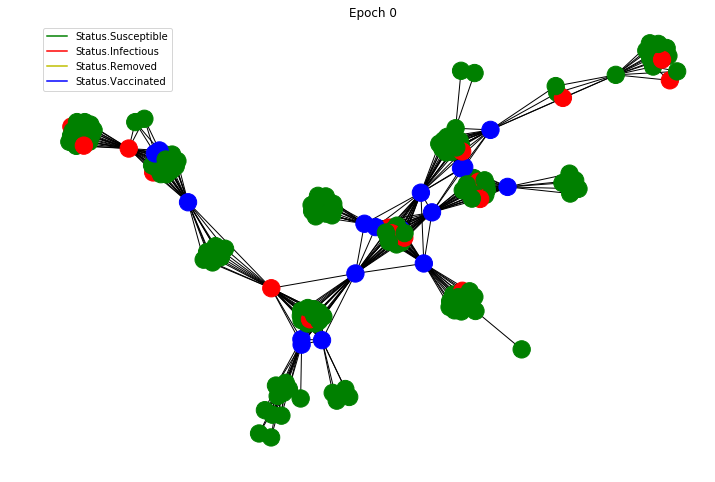

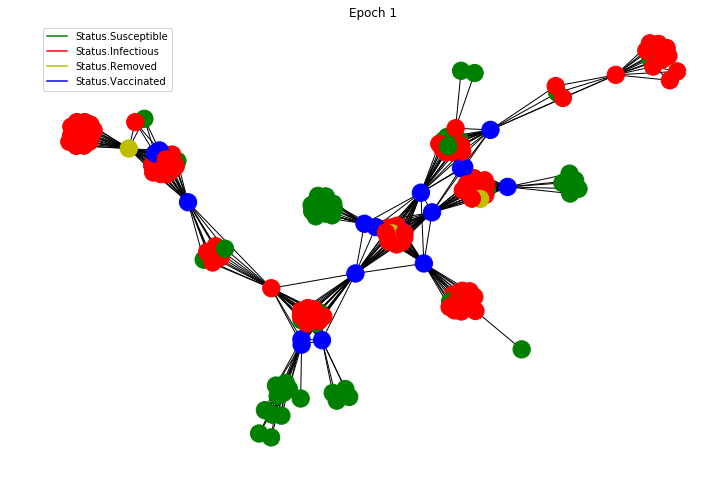

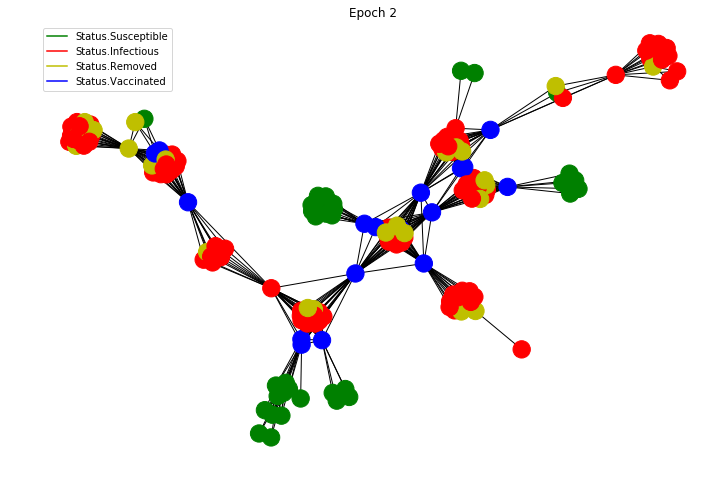

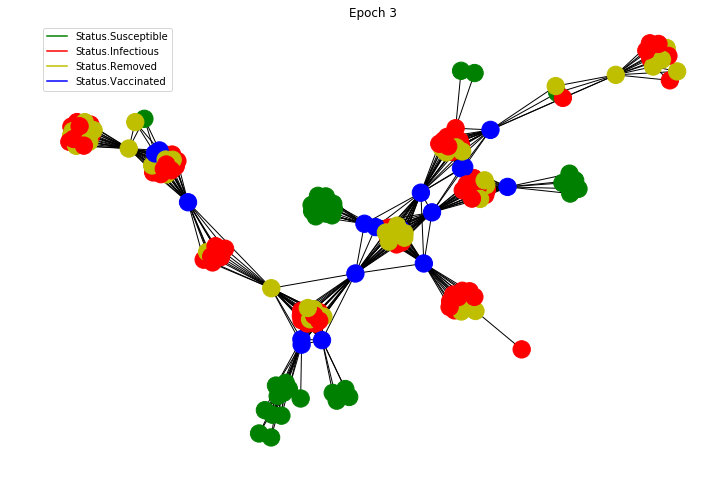

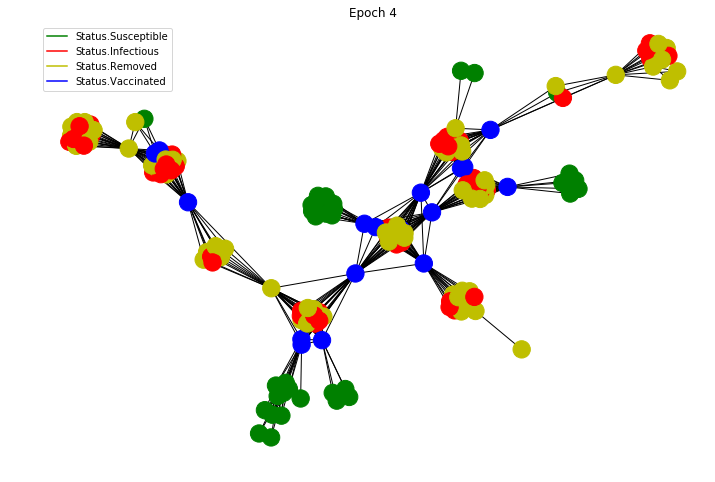

...

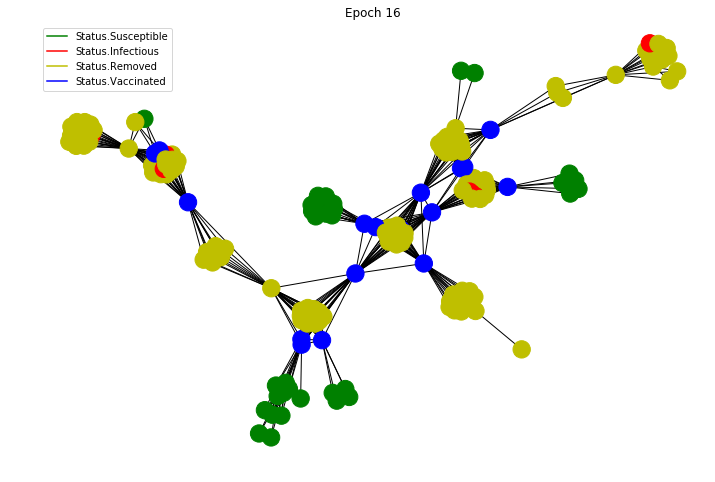

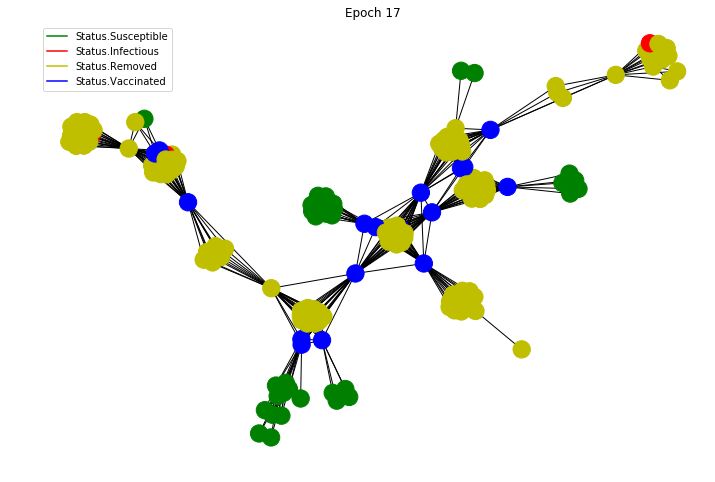

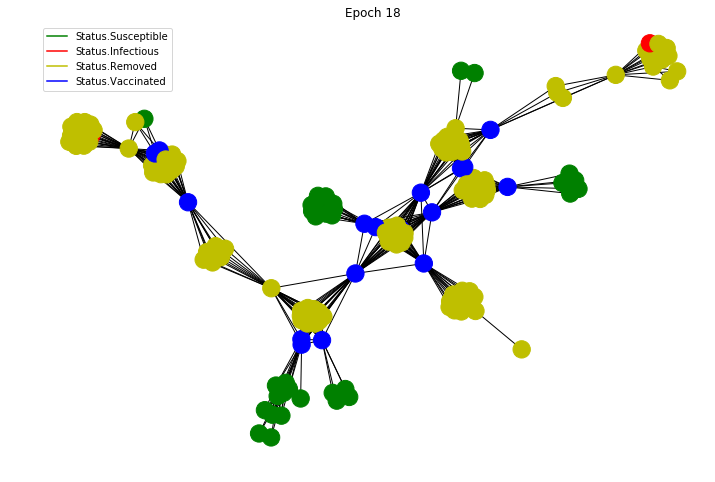

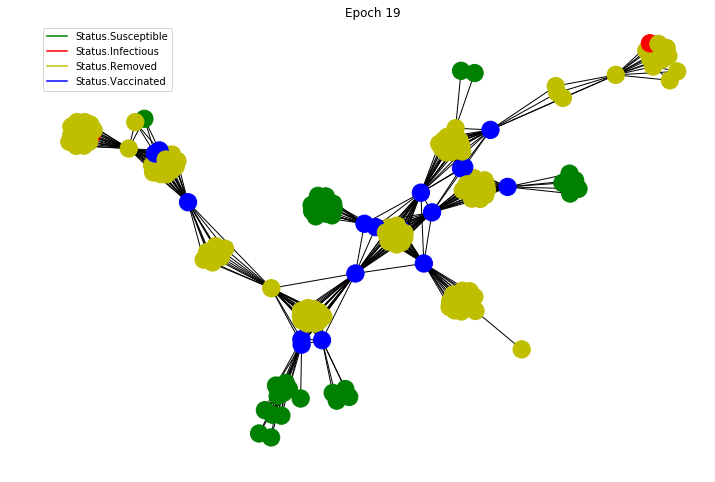

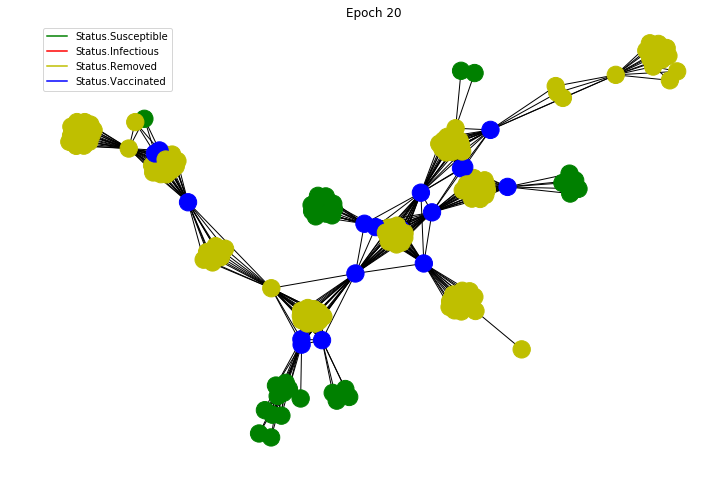

Total: 85440$


In [385]:
cycle(coauth_comp, isolate_max_weighted_degree, comp_layout)

Чуть лучше, но незначительно.

## Блокировка заболевания

Попробуем теперь отталкиваться от начальной позиции и пытаться изолировать тех, кто находится в тесном контакте с зараженными:

In [386]:
def isolate_friends(G):
    friendship_measure = {}
    for node in G.nodes:
        if G.nodes[node]['status'] == Status.Infectious:
            for friend, attrs in G[node].items():
                if G.nodes[friend]['status'] == Status.Susceptible:
                    friendship_measure[friend] = friendship_measure.get(friend, 0) + attrs['p']
    
    top_friends = sorted(
        friendship_measure.keys(),
        key=lambda node: friendship_measure[node],
        reverse=True
    )[:len(G.nodes)//10]
    
    v_money = 0
    for node in top_friends:
        G.nodes[node]['status'] = Status.Vaccinated
        v_money += 500
    return v_money

/usr/local/lib/python3.6/dist-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


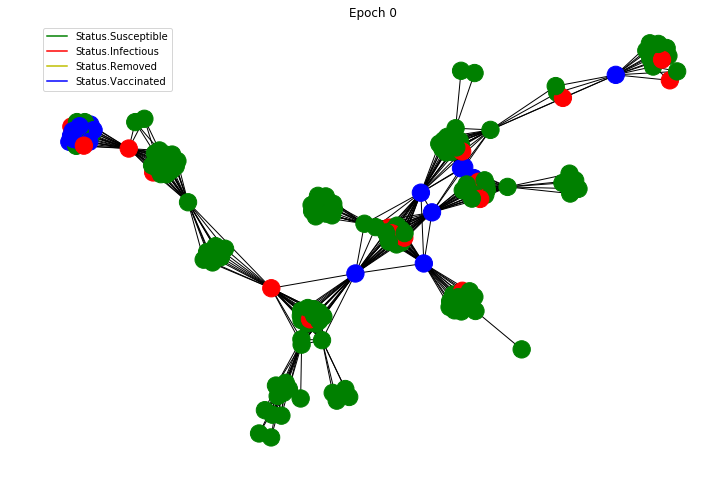

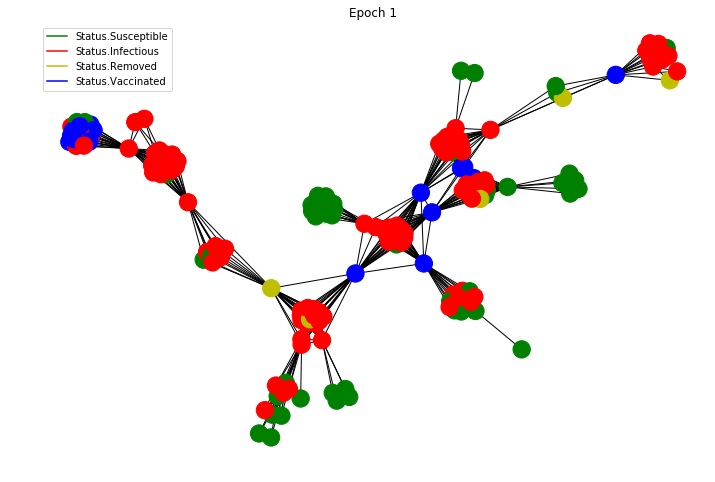

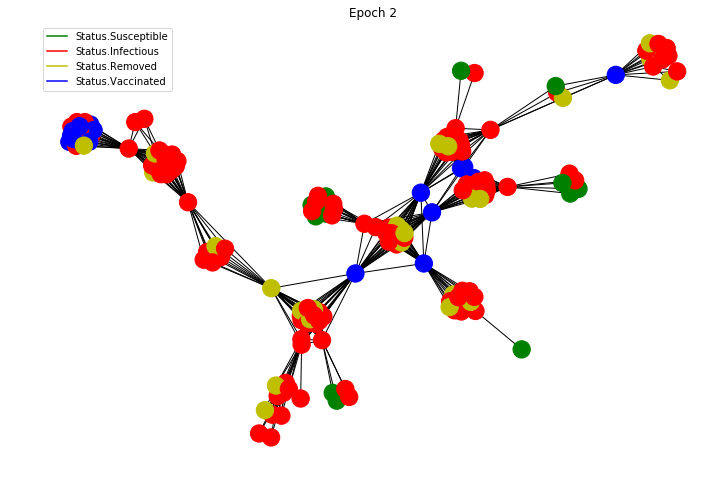

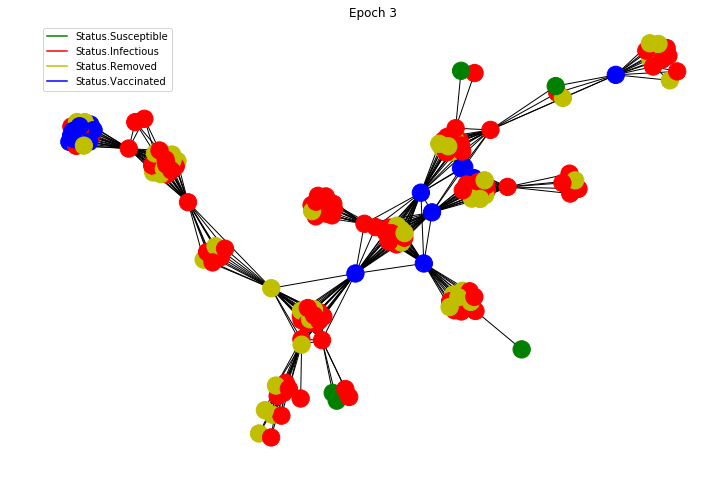

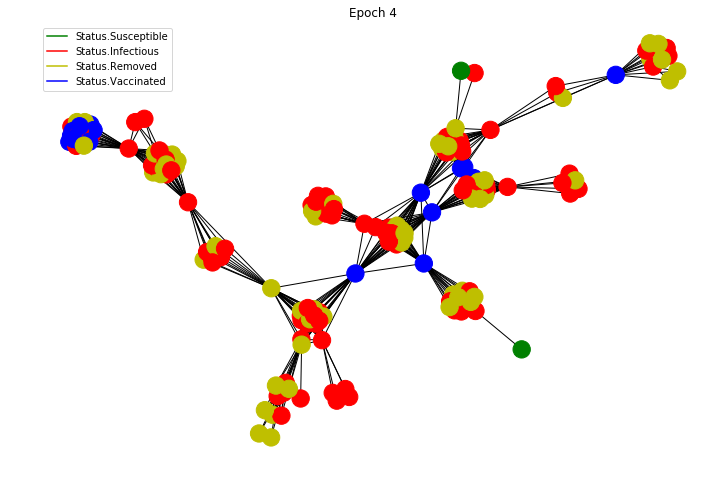

...

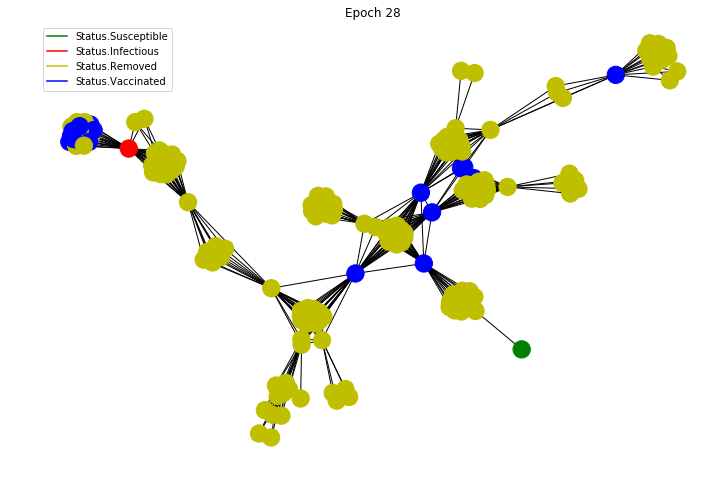

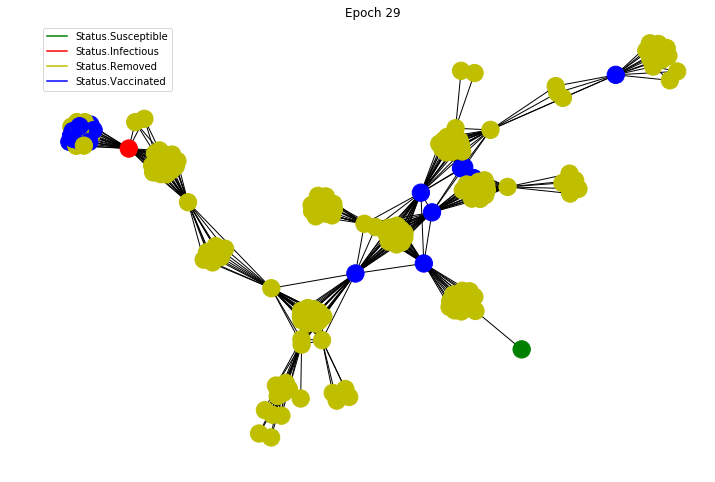

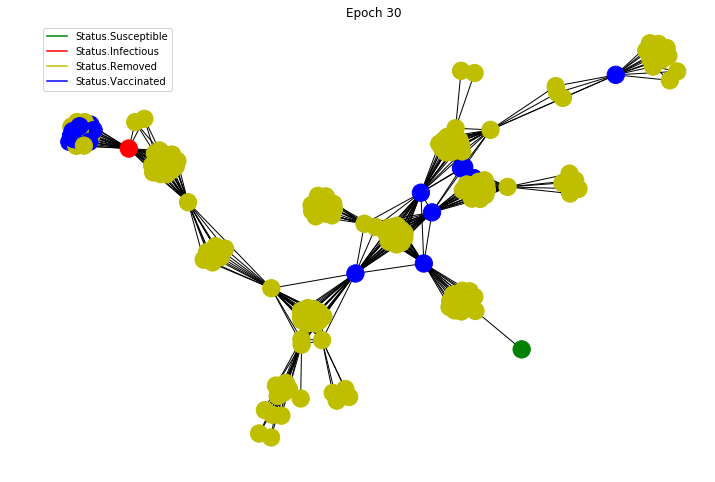

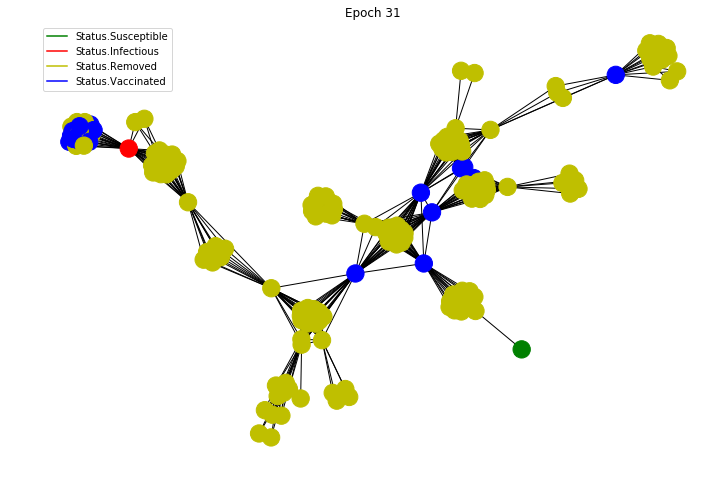

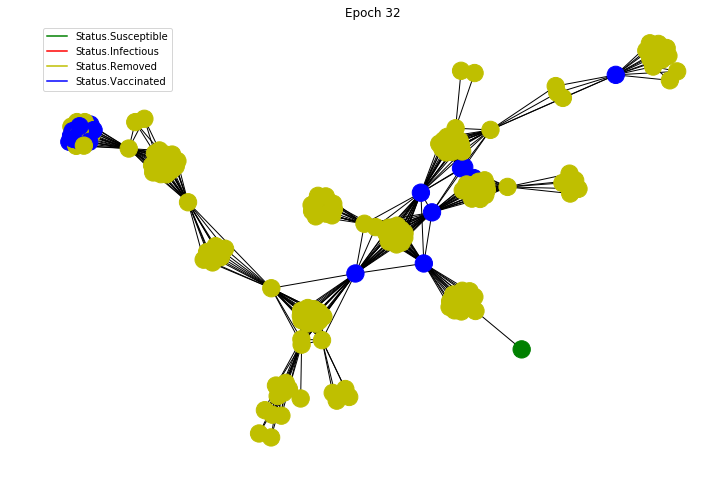

Total: 116640$


In [387]:
cycle(coauth_comp, isolate_friends, comp_layout)

Получилось плохо, т.к. вся вакцина ушла в одну часть графа(вверху слева), видимо там самые дружные ребята, но даже это не помогло.

Изменим стратегию: попытаемся изолировать столько больных, сколько сможем, прямо отрезав их вакцинированными соседями. Может быть, тогда в эту часть графа болезнь из другого очага не достанет.

In [391]:
def block_virus(G):
    ease_of_block = {}
    for node in G.nodes:
        if G.nodes[node]['status'] == Status.Infectious:
            ease_of_block[node] = len(G[node])
    
    vaccinated = 0
    v_money = 0
    for ill in sorted(ease_of_block.keys(), key=lambda node: ease_of_block[node]):
        for node in G[ill].keys():
            if G.nodes[node]['status'] == Status.Susceptible:
                G.nodes[node]['status'] = Status.Vaccinated
                v_money += 500
                vaccinated += 1
                if vaccinated == len(G.nodes) // 10:
                    break
        if vaccinated == len(G.nodes) // 10:
            break
        
    return v_money

/usr/local/lib/python3.6/dist-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


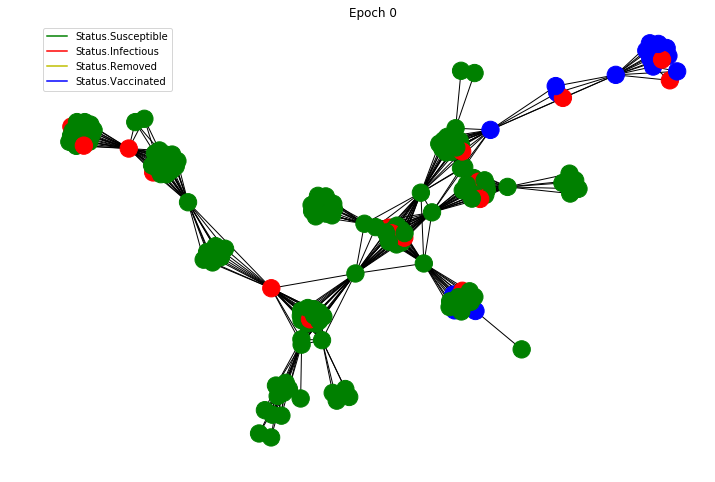

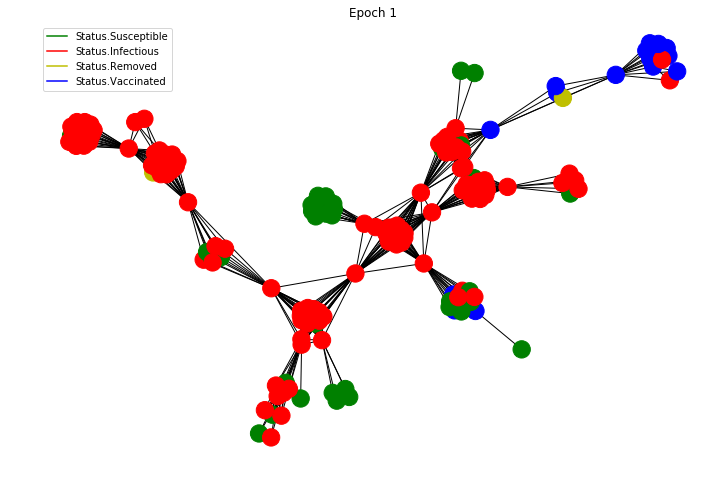

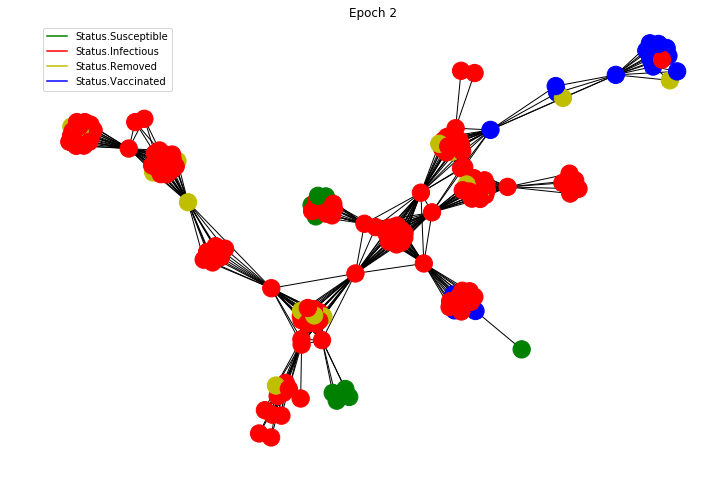

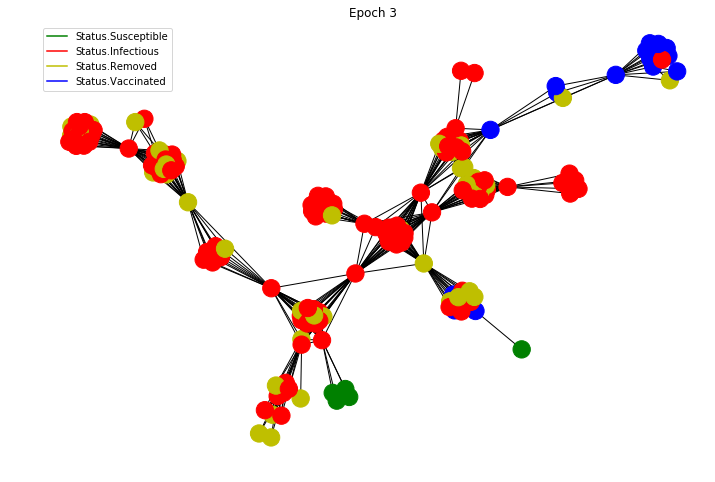

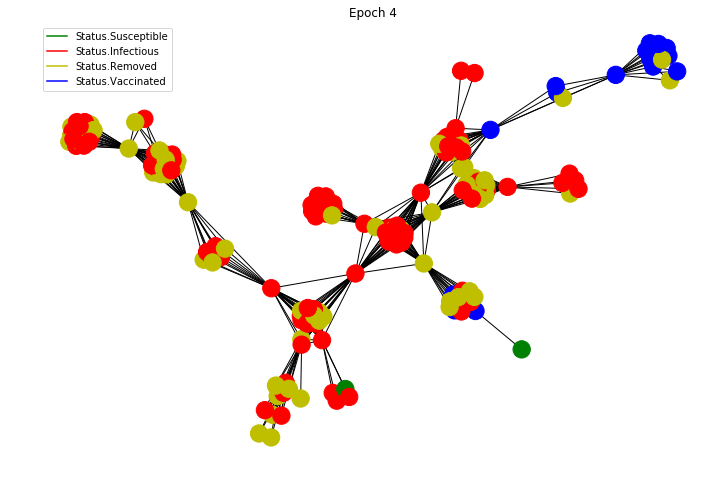

...

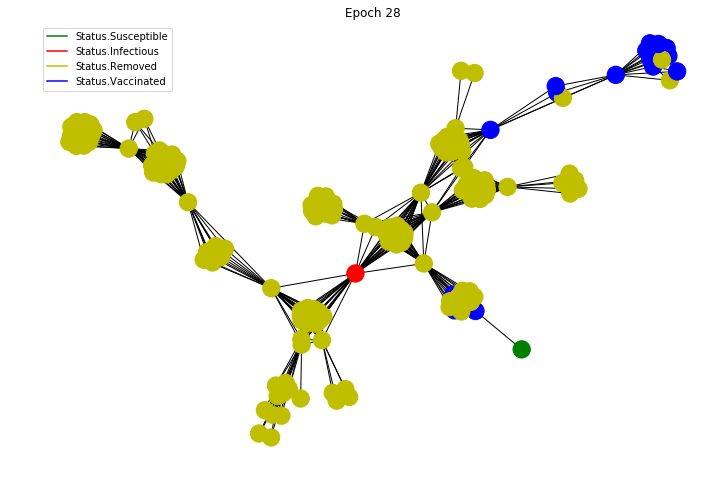

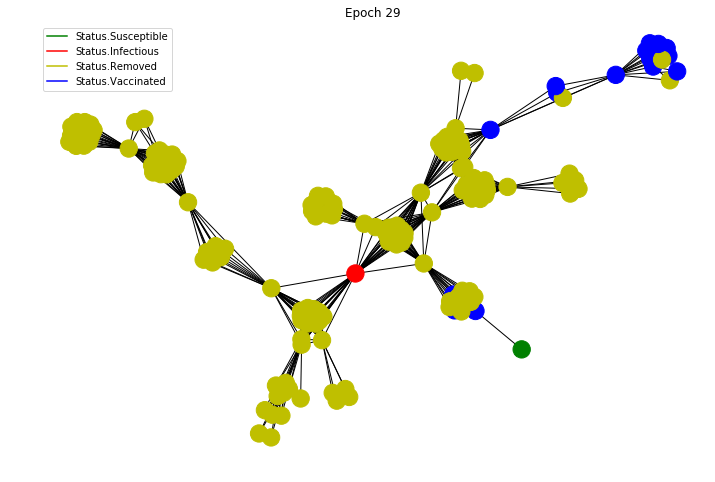

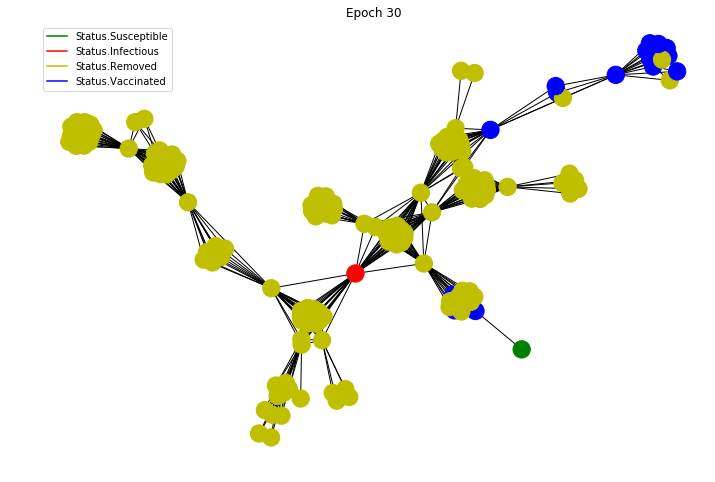

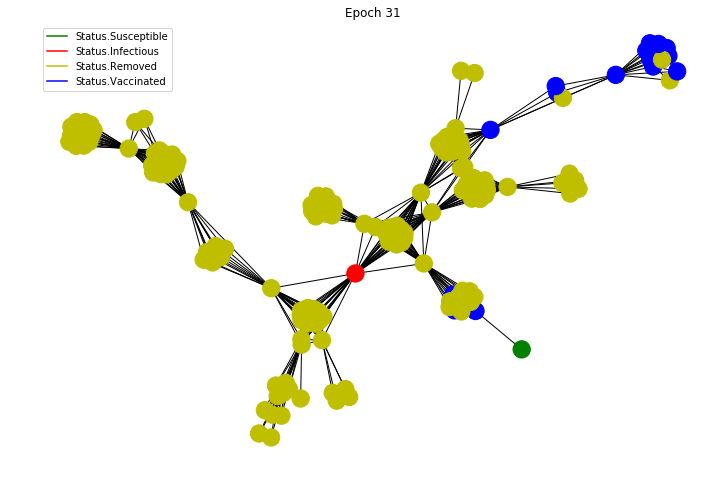

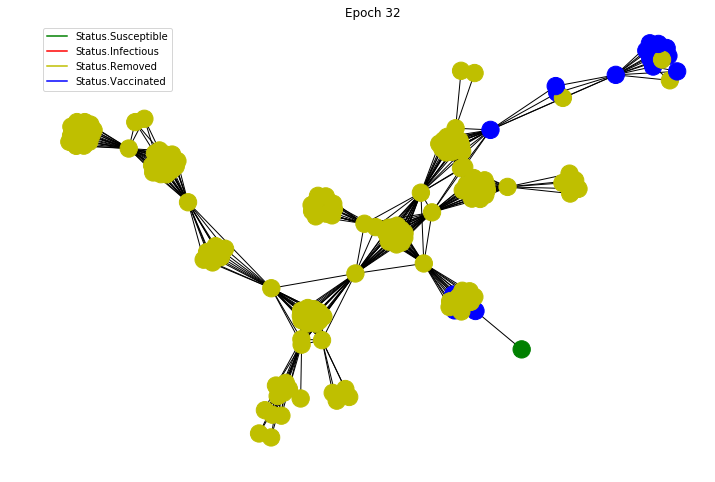

Total: 106920$


In [392]:
cycle(coauth_comp, block_virus, comp_layout)

К сожалению, план провалился - хоть мы и попытались заблокировать верхнюю правую часть, болезнь все равно успела проникнуть везде, куда могла.

## Итог

Лучше всего показала себя вакцинация вершин с самой высокой степенью/взвешенной степенью(Total: 86040 \\$ /Total: 85440 \\$). Из-за специальной структуры графа, такие вершины находятся в "узких местах" графа (минимальных разрезах) и зачастую блокируют распространение заболевания. Попытки специально заблокировать очаги, чтобы заблокировать распространение, успехом не увенчались.